In [16]:
from PIL import Image
import numpy as np
from matplotlib import pyplot as plt
import glob
import pandas as pd
%matplotlib inline
from keras_tqdm import TQDMNotebookCallback
import cv2
from keras.applications.imagenet_utils import preprocess_input

from keras.models import Sequential
from keras.layers import Dense
from keras.models import Model

In [2]:
%cd ~/nbs/ssd_keras/
import pickle
from ssd import SSD300
from ssd_training import MultiboxLoss
from ssd_utils import BBoxUtility

/home/ubuntu/nbs/ssd_keras


## pre-processing

In [3]:
import os
% cd /mnt/kaggle_seals
train_imgs = sorted(glob.glob('Train/*.jpg'), key=lambda name: int(os.path.basename(name)[:-4]))
train_dot_imgs = sorted(glob.glob('TrainDotted/*.jpg'), key=lambda name: int(os.path.basename(name)[:-4]))

/mnt/kaggle_seals


In [13]:
len(train_imgs)

948

## Kaggle Kernel

## pretrained SSD try
didnt work so well ofcourse

In [ ]:
#load images
#split them
#load ssd
#try to predict... see if its good - no
#extract dots and convert to boxes
#Train ssd


In [55]:

NUM_CLASSES=8
priors = pickle.load(open('prior_boxes_ssd300.pkl', 'rb'))
bbox_util = BBoxUtility(NUM_CLASSES, priors)

In [49]:
model = SSD300([300,300,3], num_classes=8)
model.load_weights('/mnt/weights_SSD300.hdf5', by_name=True)

In [61]:
img=c[137]

In [56]:

val_preds=model.predict(np.expand_dims(c[137],0)) #ssd predict
results = bbox_util.detection_out(val_preds)

In [73]:
results[0][1]

array([ 4.        ,  0.96244884,  0.68954295,  0.04159462,  0.98001426,
        0.57631207])

In [78]:
relevant_results

array([[ 1.        ,  0.98915172,  0.11572546,  0.48037088,  0.96573621,
         0.88137245],
       [ 4.        ,  0.96244884,  0.68954295,  0.04159462,  0.98001426,
         0.57631207],
       [ 1.        ,  0.946702  ,  0.18025357,  0.19980878,  0.94817859,
         0.73893189],
       ..., 
       [ 2.        ,  0.56338775,  0.17675796,  0.25870961,  0.27053395,
         0.36959398],
       [ 4.        ,  0.56305945,  0.00773036,  0.5126546 ,  0.36154014,
         0.97855192],
       [ 3.        ,  0.56296045,  0.38856858,  0.36710364,  0.4595632 ,
         0.448852  ]])

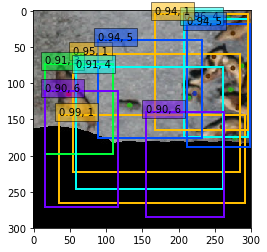

In [79]:
plt.imshow(c[137] / 255.)


colors = plt.cm.hsv(np.linspace(0, 1, 9)).tolist()

currentAxis = plt.gca()
for i in range(10):
    relevant_results=results[0]
    xmin = int(round(relevant_results[i][2] * img.shape[1]))
    ymin = int(round(relevant_results[i][3] * img.shape[0]))
    xmax = int(round(relevant_results[i][4] * img.shape[1]))
    ymax = int(round(relevant_results[i][5] * img.shape[0]))
    label = int(relevant_results[i][0])
    score = relevant_results[i][1]
    coords = [(xmin, ymin), xmax-xmin+1, ymax-ymin+1]
    color = colors[label]
    currentAxis.add_patch(plt.Rectangle(*coords, fill=False, edgecolor=color, linewidth=2))
    display_txt = '{:0.2f}, {}'.format(score, label)
    currentAxis.text(xmin, ymin, display_txt, bbox={'facecolor':color, 'alpha':0.5})

#currentAxis.add_patch(plt.Rectangle([x_min,y_min],width,height, fill=False, edgecolor='r', linewidth=2))
#currentAxis.text(x_min, y_min, fish_id+1, bbox={'facecolor':'r', 'alpha':0.5})

plt.show()

## find the fucking dots

In [84]:
image_dot = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_dot = image_dot[1350:1900, 3000:3400]

In [90]:
a=Image.open(train_dot_imgs[0])
a_=Image.open(train_imgs[0])

In [105]:
x

1272.0458984375

Sea Lions Found: 60


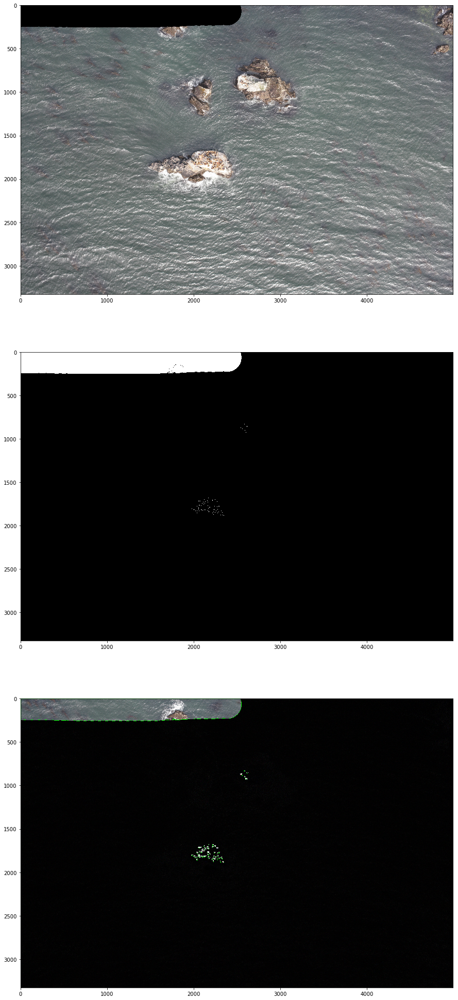

In [98]:
import cv2
index = 5

#image =np.array(a) #cv2.cvtColor(cv2.imread(train_imgs[index]), cv2.COLOR_BGR2RGB)
#image_dot = np.array(a_)#cv2.cvtColor(cv2.imread(train_dot_imgs[index]), cv2.COLOR_BGR2RGB)

#img = image[1350:1900, 3000:3400]
#img_dot = image_dot[1350:1900, 3000:3400]
img=np.array(Image.open('Train/2.jpg'))
img_dot=np.array(Image.open('TrainDotted/2.jpg'))
#img_c = np.copy(img)

diff = cv2.absdiff(img_dot, img)
gray = cv2.cvtColor(diff, cv2.COLOR_RGB2GRAY)
ret,th1 = cv2.threshold(gray,0,255,cv2.THRESH_BINARY | cv2.THRESH_OTSU)
#plt.figure(figsize=(16,8))
#plt.imshow(th1, 'gray')

cnts = cv2.findContours(th1.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)[-2]
print("Sea Lions Found: {}".format(len(cnts)))

for (i, c) in enumerate(cnts):
	((x, y), _) = cv2.minEnclosingCircle(c)
	cv2.putText(diff, "{}".format(i + 1), (int(x) - 10, int(y)),cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)
	cv2.drawContours(diff, [c], -1, (0, 255, 0), 2)

#plt.figure(figsize=(16,8))
#plt.imshow(diff)

f, ax = plt.subplots(3,1,figsize=(18,35))
(ax1, ax2, ax3) = ax.flatten()
ax1.imshow(img_dot)
ax2.imshow(th1, 'gray')
ax3.imshow(diff)
#plt.show()

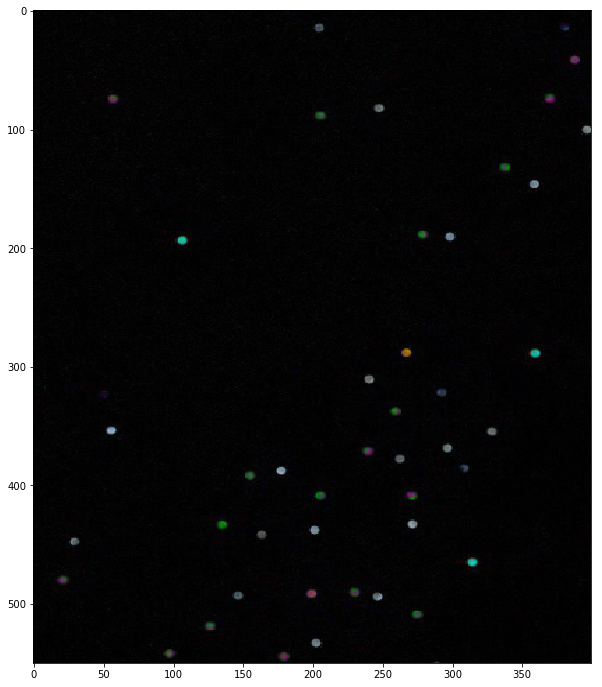

In [101]:
plt.figure(figsize=(10,12))
plt.imshow(cv2.absdiff(img_dot, img), aspect='auto')

### kaggle dot script
[https://www.kaggle.com/philschmidt/noaa-fisheries-steller-sea-lion-population-count/sea-lion-correlations-cv2-template-matching/notebook]

In [49]:
df = pd.read_csv('Train/train.csv')
print("{} training samples total".format(df.shape[0]))
df.head()

948 training samples total


,train_id,adult_males,subadult_males,adult_females,juveniles,pups
0,0,62,12,486,42,344
1,1,2,20,0,12,0
2,2,2,0,38,20,0
3,3,8,5,41,7,38
4,4,6,9,2,0,0


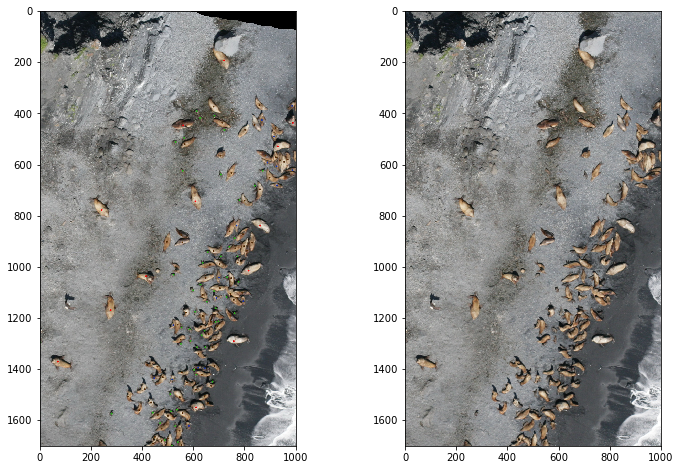

In [114]:
from skimage.io import imread, imshow
from skimage.util import crop
import cv2

cropped_dotted =np.array(a)[800:2500,2500:3500,:]
cropped_raw = np.array(a_)[800:2500,2500:3500,:]

fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(1,2,1)
plt.imshow(cropped_dotted)
ax = fig.add_subplot(1,2,2)
plt.imshow(cropped_raw)

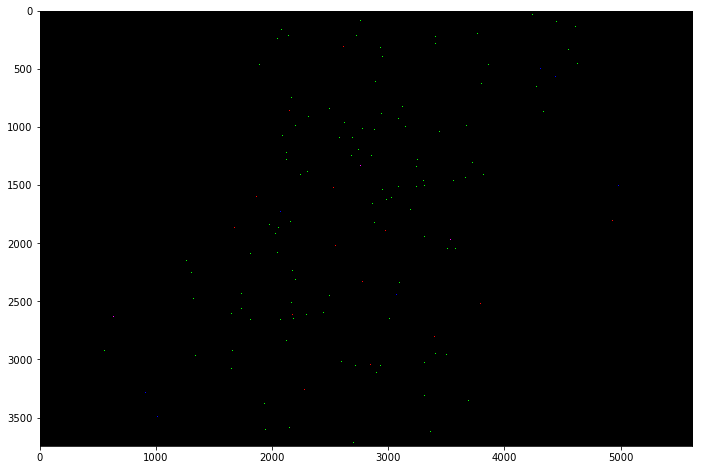

In [130]:
#show and tell
diff = cv2.subtract(img_dot, img)
diff = diff/diff.max()
plt.figure(figsize=(12,8))
plt.imshow((diff > 0.20).astype(float))
plt.grid(False)

In [170]:
img,img_dot=read_image(0)

In [173]:
diff = cv2.absdiff(img_dot, img)
gray = cv2.cvtColor(diff, cv2.COLOR_RGB2GRAY)
ret,th1 = cv2.threshold(gray,0,255,cv2.THRESH_BINARY | cv2.THRESH_OTSU)

cnts = cv2.findContours(th1.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)[-2]
print("Sea Lions Found: {}".format(len(cnts)))

x, y = [], []

lion_patches = []
radius=40
for loc in cnts:
    ((xx, yy), _) = cv2.minEnclosingCircle(loc)

    # store patches of some sea lions
    if xx > 10 and xx < gray.shape[1] - 10:
        lion_patches.append(img[yy-radius:yy+radius, xx-radius:xx+radius])

    x.append(xx)
    y.append(yy)

x = np.array(x)
y = np.array(y)

Sea Lions Found: 1135


/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:17: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


In [181]:
choices

array([ 239,  911,  942,  165, 1109,  706,  744, 1129,  178,  142,  284,
        292,  291, 1013,   23,  241])

In [182]:
lion_patches[1109].shape

(0, 80, 3)

/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:10: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/ubuntu/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_base.py:3179: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=-0.5, top=-0.5
  'bottom=%s, top=%s') % (bottom, top))


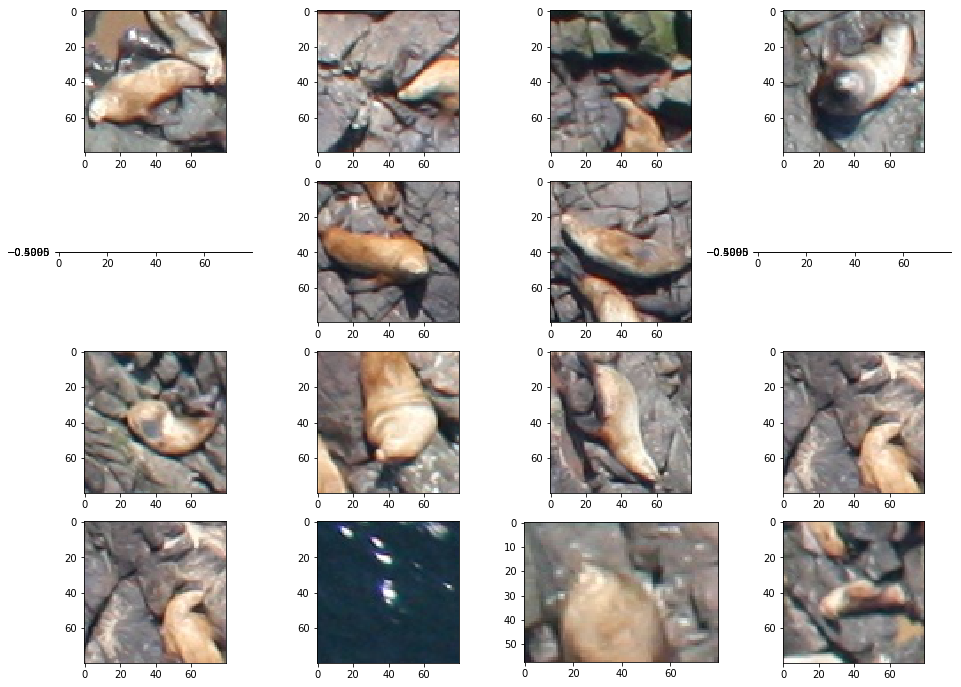

In [179]:
n_images_total = 16
n_images_per_row = 4

fig = plt.figure(figsize=(16,12))
choices=np.random.choice(len(cnts),16)
for i,j in enumerate(choices):
    ax = fig.add_subplot(4,n_images_per_row,i+1)
    plt.grid(False)
    #plt.imshow(lion_patches[j])
    plt.imshow(img[y[j]-radius:y[j]+radius, x[j]-radius:x[j]+radius])

## train ssd

In [194]:
# calc bbs (centers) from raw and dotted img
def calc_bbs(dotted, raw): 
    diff = cv2.absdiff(dotted, raw)
    gray = cv2.cvtColor(diff, cv2.COLOR_RGB2GRAY)
    ret,th1 = cv2.threshold(gray,0,255,cv2.THRESH_BINARY | cv2.THRESH_OTSU)

    cnts = cv2.findContours(th1.copy(), cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)[-2]
    print("Sea Lions Found: {}".format(len(cnts)))

    x, y = [], []

    #lion_patches = []

    radius=25

    for loc in cnts:
        ((xx, yy), _) = cv2.minEnclosingCircle(loc)

        # store patches of some sea lions
        if xx > 10 and xx < gray.shape[1] - 10:
 
            lion_patches.append(raw[yy-radius:yy+radius, xx-radius:xx+radius])

        x.append(xx)
        y.append(yy)

    x = np.array(x)
    y = np.array(y)
    print(len(x),len(y))
    return [x,y]

In [5]:
NUM_CLASSES=2

%cd ~/nbs/ssd_keras/
priors = pickle.load(open('prior_boxes_ssd300.pkl', 'rb'))
bbox_util = BBoxUtility(NUM_CLASSES, priors)

/home/ubuntu/nbs/ssd_keras


In [6]:
%cd /mnt/kaggle_seals/
mismatched_df=pd.read_csv('mismatched.csv')

/mnt/kaggle_seals


In [7]:
mismatched=np.append(mismatched_df.train_id.values,[7,21,22,26,61,67])

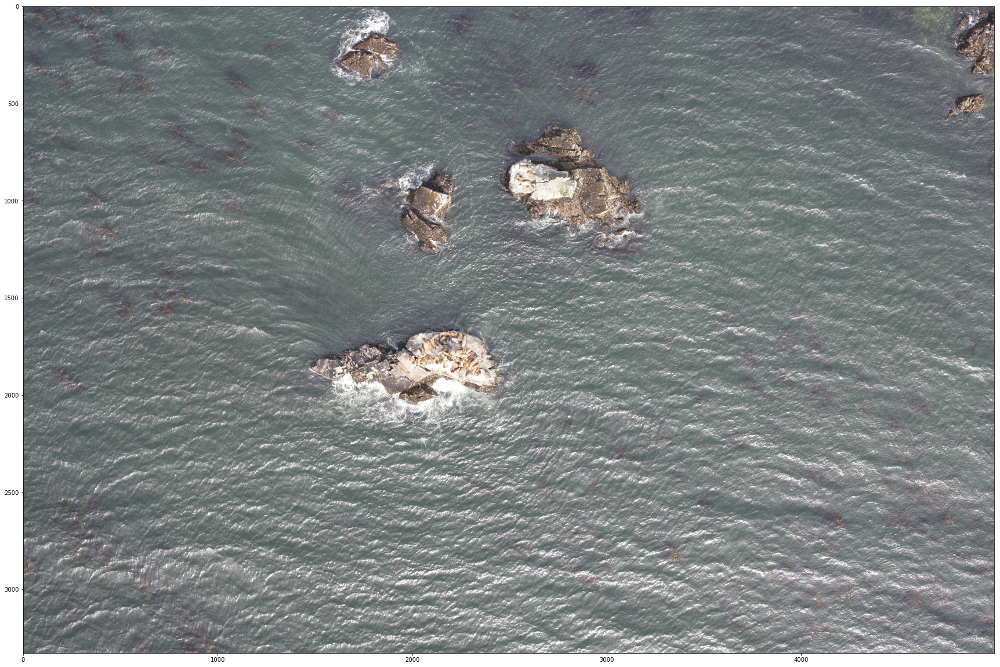

In [84]:
fig = plt.figure(figsize=(30,30))
plt.imshow(img)

In [192]:
x=calc_bbs(img_dot,img)

Sea Lions Found: 1135


In [188]:
len(x)

1135

In [128]:
def read_image(i):
    img=np.array(Image.open('Train/{}.jpg'.format(i)))
    img_dot=np.array(Image.open('TrainDotted/{}.jpg'.format(i)))
    return img,img_dot

In [370]:
%cd /mnt/kaggle_seals/

limit=50
m=0
anot_id_list=[]
anot_content_list=[]
train_inputs=[]
train_targets=[]
shifts=[]
raidus=30
for file,file_dot in zip(train_imgs,train_dot_imgs): # reading the images takes place here
    file_num=file.split('/')[1].split('.')[0]

    if not int(file_num) in mismatched:
        img=np.array(Image.open(file))
        img_dot=np.array(Image.open(file_dot))
        x,y=calc_bbs(img_dot,img)
 
        m+=1
         # x and y are arrays -from large image. need to be converted to small images
        crop_size=224
        for x_i,y_i in zip(x,y):
            x_shift=np.random.choice(int((crop_size*0.85)-(crop_size/2*0.85))) #shift is needed so cropped iage won't be always centered
            y_shift=np.random.choice(int((crop_size*0.85)-(crop_size/2*0.85)))
            #shifts.append(x_i,y_i)
            cropped_img=img[y_i-crop_size/2-y_shift:y_i+crop_size/2-y_shift,\
                            x_i-crop_size/2-x_shift:x_i+crop_size/2-x_shift,:]
            print(y_i-(300-y_shift),y_i+y_shift)
            if cropped_img.shape[0]==crop_size and cropped_img.shape[1]==crop_size:

       
                anot_id=file
                #anot_data=[[(150+x_shift+raidus)/size[0],(150+y_shift+raidus)/size[1],(150+x_shift-raidus)/size[0],(150+y_shift-raidus)/size[1],1]]
                anot_data=[[(crop_size/2+x_shift-raidus)/crop_size,(crop_size/2+y_shift-raidus)/crop_size,\
                            (crop_size/2+x_shift+raidus)/crop_size,(crop_size/2+y_shift+raidus)/crop_size,1]]
                anot_id_list.append(anot_id)
                anot_content_list.append(anot_data)

                z = anot_data.copy()


                z_processed = bbox_util.assign_boxes(np.array(z))
                train_inputs.append(cropped_img)  #.astype('float32')           
                train_targets.append(z_processed)
        if m>2:
            break #dont do all at once.. no choice. need to use generator, for easing on memory
train_target_array=np.array(train_targets)
train_array=np.array(train_inputs)
#X_train=preprocess_input(train_array)

/mnt/kaggle_seals
Sea Lions Found: 1135
1135 1135


/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:22: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:27: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


Sea Lions Found: 445
445 445
Sea Lions Found: 60
60 60


In [286]:
train_array.shape

(0,)

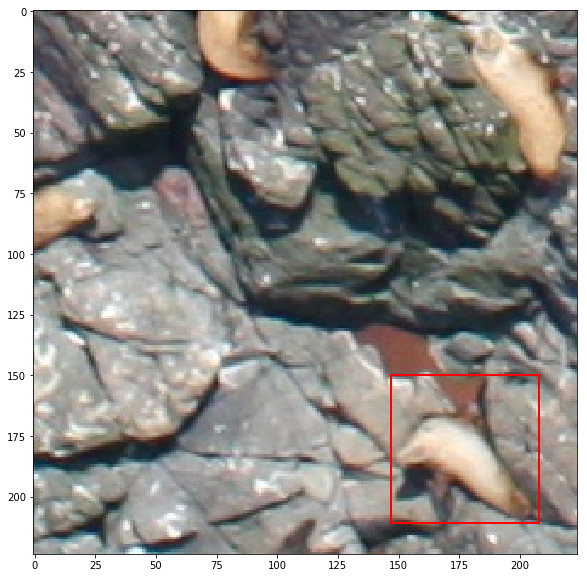

In [422]:
i=21#img_id

fig = plt.figure(figsize=(10,10))
plt.imshow(train_array[i])
currentAxis = plt.gca()

#color = colors[label]
xmin, ymin, xmax, ymax=anot_content_list[i][0][:4] #seal id in img
xmin, ymin, xmax, ymax=(xmin*crop_size, ymin*crop_size, xmax*crop_size, ymax*crop_size)
currentAxis.add_patch(plt.Rectangle((xmin, ymin), xmax-xmin+1, ymax-ymin+1, fill=False, edgecolor='r', linewidth=2))

In [349]:
xmin,xmax

(131.0, 211.0)

/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:1: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  if __name__ == '__main__':


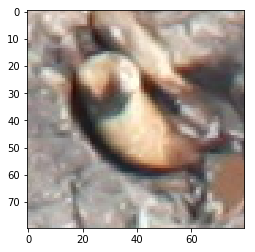

In [350]:
plt.imshow(train_array[i][ymin:ymax,xmin:xmax])

In [209]:
#callback s
def schedule(epoch, decay=0.9):
    return base_lr * decay**(epoch)

hist_folder='/mnt/kaggle_seals/ssd_checkpoints/weights.{epoch:02d}-{val_loss:.2f}.hdf5'

callbacks = [keras.callbacks.ModelCheckpoint(hist_folder,
        verbose=1, save_weights_only=True),keras.callbacks.LearningRateScheduler(schedule),
            TQDMNotebookCallback(leave_inner=True)]

In [210]:
#d val
from sklearn.model_selection import train_test_split

X_trn,X_val,y_trn,y_val=train_test_split(train_array,train_target_array)

In [211]:
input_shape = (300, 300, 3)
model = SSD300(input_shape, num_classes=NUM_CLASSES)

model.load_weights('/mnt/weights_SSD300.hdf5', by_name=True)

In [212]:
base_lr = 3e-4
optim = keras.optimizers.Adam(lr=base_lr)
# optim = keras.optimizers.RMSprop(lr=base_lr)
# optim = keras.optimizers.SGD(lr=base_lr, momentum=0.9, decay=decay, nesterov=True)
model.compile(optimizer=optim,loss=MultiboxLoss(NUM_CLASSES, neg_pos_ratio=2.0).compute_loss)

In [ ]:
np.array(train_targets).shape

In [227]:
#train SSD
history=model.fit(X_trn,y_trn,batch_size=16,nb_epoch=30,
          callbacks=callbacks,
          validation_data=(X_val,y_val),
          verbose=0)


Epoch 00000: saving model to /mnt/kaggle_seals/ssd_checkpoints/weights.00-1.98.hdf5
Epoch 00001: saving model to /mnt/kaggle_seals/ssd_checkpoints/weights.01-1.96.hdf5
Epoch 00002: saving model to /mnt/kaggle_seals/ssd_checkpoints/weights.02-1.92.hdf5
Epoch 00003: saving model to /mnt/kaggle_seals/ssd_checkpoints/weights.03-1.93.hdf5
Epoch 00004: saving model to /mnt/kaggle_seals/ssd_checkpoints/weights.04-1.89.hdf5
Epoch 00005: saving model to /mnt/kaggle_seals/ssd_checkpoints/weights.05-1.89.hdf5
Epoch 00006: saving model to /mnt/kaggle_seals/ssd_checkpoints/weights.06-1.86.hdf5
Epoch 00007: saving model to /mnt/kaggle_seals/ssd_checkpoints/weights.07-1.84.hdf5
Epoch 00008: saving model to /mnt/kaggle_seals/ssd_checkpoints/weights.08-1.87.hdf5
Epoch 00009: saving model to /mnt/kaggle_seals/ssd_checkpoints/weights.09-1.88.hdf5
Epoch 00010: saving model to /mnt/kaggle_seals/ssd_checkpoints/weights.10-1.87.hdf5
Epoch 00011: saving model to /mnt/kaggle_seals/ssd_checkpoints/weights.11-1

### visual validation

In [228]:

model.load_weights('/mnt/kaggle_seals/ssd_checkpoints/weights.10-1.87.hdf5', by_name=True)

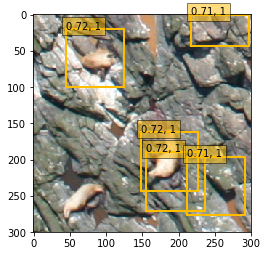

In [231]:
colors = plt.cm.hsv(np.linspace(0, 1, 9)).tolist()
ids=np.random.choice(2640,25)

j=10
#for i in range(25):
    #fig = plt.figure(figsize=(20,20))
    #ax = fig.add_subplot(1,2,1)
    #plt.imshow(cropped_dotted)
    #ax = fig.add_subplot(5,5,i+1)
    #plt.grid(False)
plt.imshow(train_array[j])

val_preds=model.predict(np.expand_dims(train_array[j],0)) #ssd predict
results = bbox_util.detection_out(val_preds)
currentAxis = plt.gca()

for i in range(5):
    relevant_results=results[0]
    xmin = int(round(relevant_results[i][2] * 300))
    ymin = int(round(relevant_results[i][3] * 300))
    xmax = int(round(relevant_results[i][4] * 300))
    ymax = int(round(relevant_results[i][5] * 300))
    label = int(relevant_results[i][0])
    score = relevant_results[i][1]
    coords = [(xmin, ymin), xmax-xmin+1, ymax-ymin+1]
    color = colors[label]
    currentAxis.add_patch(plt.Rectangle(*coords, fill=False, edgecolor=color, linewidth=2))
    display_txt = '{:0.2f}, {}'.format(score, label)
    currentAxis.text(xmin, ymin, display_txt, bbox={'facecolor':color, 'alpha':0.5})


## seal size, orientation, existance

In [236]:
cd .

/mnt/kaggle_seals


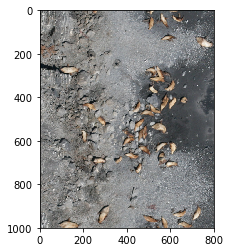

In [237]:
# read images again for template matching code
cropped_dotted = np.array(Image.open('TrainDotted/8.jpg'))[1000:2000,2000:2800,:]
cropped_raw = np.array(Image.open('Train/8.jpg'))[1000:2000,2000:2800,:]
plt.imshow(cropped_raw)

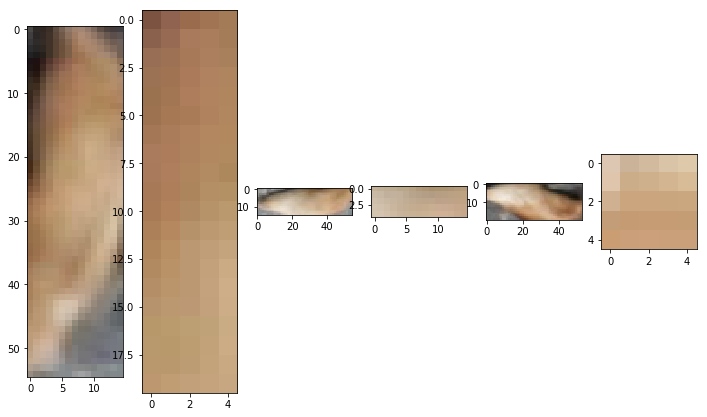

In [239]:
plt.clf()
sealions = [
    cropped_raw[35:90, 505:520],
    cropped_raw[40:60, 510:515],
    cropped_raw[930:945, 610:665],
    cropped_raw[935:940, 630:645],
    cropped_raw[658:678, 395:448],
    cropped_raw[668:673, 415:420]
]
fig = plt.figure(figsize=(12,8))
for i in range(len(sealions)):
    ax = fig.add_subplot(1,len(sealions),i+1)
    plt.imshow(sealions[i])

In [466]:
from keras.applications import VGG16
vgg=VGG16()

In [390]:
from scipy.misc import imresize


/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:3: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  app.launch_new_instance()


[335 284 285 281 283]


/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:4: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


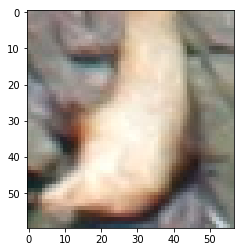

In [445]:
i=32
xmin, ymin, xmax, ymax=anot_content_list[i][0][:4] #seal id in img
xmin, ymin, xmax, ymax=(xmin*crop_size, ymin*crop_size, xmax*crop_size, ymax*crop_size)
a=train_array[i][ymin:ymax,xmin:xmax]
b=imresize(a, [224,224], interp='bilinear', mode=None)
pred=vgg.predict(np.expand_dims(b,0))
print(np.argsort(pred)[:,::-1][0,:5])
plt.imshow(a)

In [450]:
choices

array([ 570,  162,  456, 1239,  960,  160,  319,  964, 1194, 1086,  871,
        440,  242,  777, 1218,  765])

In [447]:
answers={}
n_images_total = 16
n_images_per_row = 4

In [451]:
for i,j in zip(choices,[1,1,1,1,\
                        0,1,1,0,\
                        0,0,1,1,\
                        1,1,0,0]):
    answers[i]=j

/home/ubuntu/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:8: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


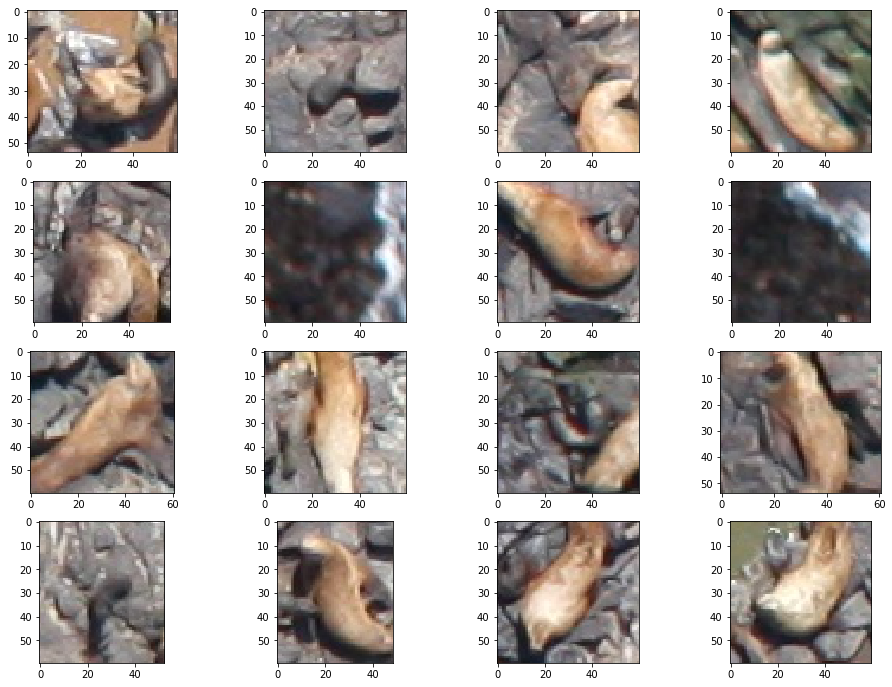

In [452]:


fig = plt.figure(figsize=(16,12))
choices=np.random.choice(len(train_array),16)
for i,j in enumerate(choices):
    xmin, ymin, xmax, ymax=anot_content_list[j][0][:4] #seal id in img
    xmin, ymin, xmax, ymax=(xmin*crop_size, ymin*crop_size, xmax*crop_size, ymax*crop_size)
    a=train_array[j][ymin:ymax,xmin:xmax]
    ax = fig.add_subplot(4,n_images_per_row,i+1)
    plt.grid(False)
    #plt.imshow(lion_patches[j])
    plt.imshow(a)

In [471]:
vgg.layers.pop()
#vgg.layers.pop()
x= vgg.layers[-1].output
x=Dense(2, activation='softmax')(x)
model2= Model(input = model.input,output=[x])
model2= Model(input = vgg.input,output=[x])

RuntimeError: Graph disconnected: cannot obtain value for tensor Tensor("input_4:0", shape=(?, 224, 224, 3), dtype=float32) at layer "input_4". The following previous layers were accessed without issue: []

In [480]:
for i,layer in enumerate(model2.layers):
    if i<18:
        model2.layers[i].trainable = False

In [481]:
for layer in model2.layers:
    print (layer.trainable)

False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
True
True
True
True
True
